**This notebook is about solving a task of an Object detection on an image.**

The task is focused on detection of two types of objects: cars themselves and car's plate.

# Ready solution

In a moden world of Data science, it's a common situation when there are repositories with ready solution for your task.

Not every repository deserves your trust, but in case when the code was provided by the interesting model's developers, it's better to start from this solution, considering it as a baseline.

In this task we're going to use a detector YOLO v5, and it's exactly the case of available code for the baseline.

## Install libraries

In [ ]:
# installation

!git clone https://github.com/ultralytics/yolov5
!pip install -r /content/yolov5/requirements.txt
# !pip install -q tensorboard opencv-python roboflow gitpython

In [ ]:
# connection to Google Drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Prepare data

Before doing the following actions, it's important to get required data and put it into ```'Datasets'``` directory at Google Drive.

In [ ]:
# !rm -rf dataset_u1
!mkdir dataset_u1
!7z x -o/content/dataset_u1/ -y -bsp2 "/content/drive/MyDrive/VideoAnalytics/Detection"

Now, when we have the data, it's important to look at some random examples of images and their markups.

Число примеров в тренировочном и валидационном датасетах: 12103 1344


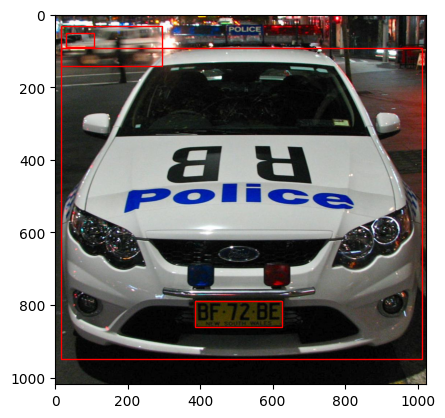

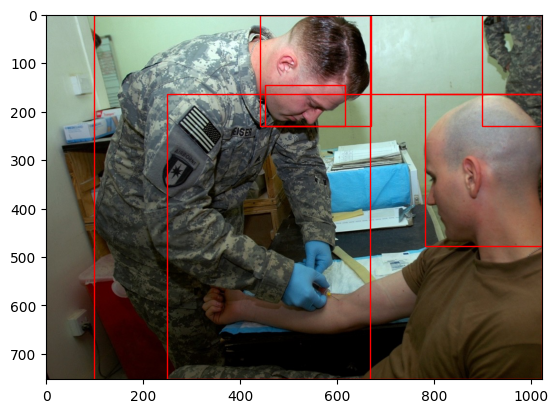

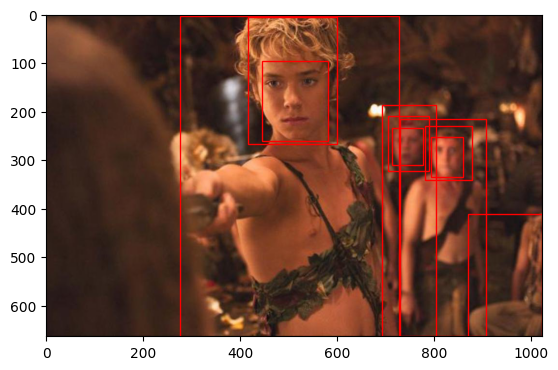

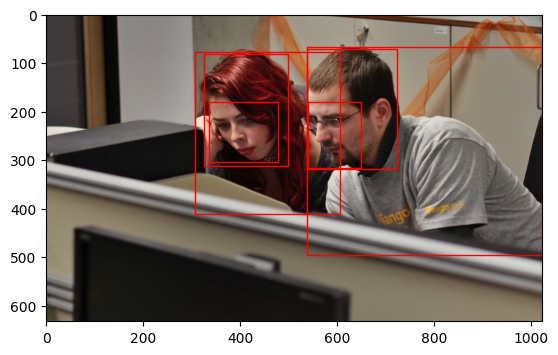

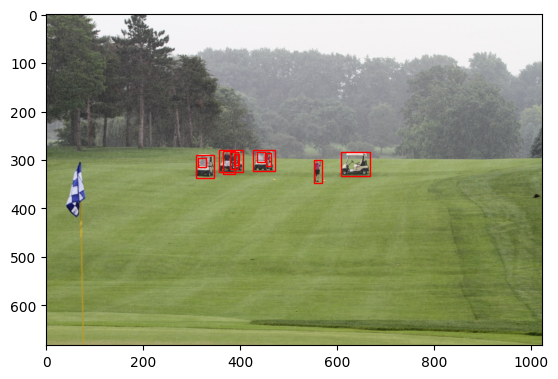

In [ ]:
import os
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.patches as patches

prefix = 'dataset_u1'

train = sorted(os.listdir(os.path.join(prefix, 'train/images')))
valid = sorted(os.listdir(os.path.join(prefix, 'valid/images')))

images = [mpimg.imread(os.path.join(prefix, f'train/images/{i}')) for i in train[:10]]
labels = []
print('Number of items at train and validation datasets:', len(train), len(valid))

for item in train[:5]:
    with open(os.path.join(prefix, f'train/labels/{item[:-4]}.txt'), 'r') as f:
        lines = [line.strip() for line in f]
        labels.append(lines)


for item, boxes in zip(images, labels):
    fig, ax = plt.subplots()
    ax.imshow(item)
    for box in boxes:
        items = box.split(' ')
        rect = patches.Rectangle((((float(items[1]) * item.shape[1]) - ((float(items[3]) * item.shape[1]) / 2)),((float(items[2]) * (item.shape[0])) - ((float(items[4]) * item.shape[0]) / 2))),float(items[3]) * item.shape[1], float(items[4]) * item.shape[0], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

## Launch Tensorboard

Tensorboard is a standard way of logging and tracking the process of model training. It can include graphs of metrics and loss function changes, drawing images, etc. YOLO v5 automatically writes logs at TensorBoard.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir yolov5

<IPython.core.display.Javascript object>

## Training YOLO v5

We're going to run the training process during 30 epoches. After that we'll get the model's weights on the best iteration from "runs/train" and repeat training using them until we get satisfying results.

Actually the whole process can be launched by one line of code. The line can include different parameters. Usually, the list of parameters can be checked running ```%run path/to/script --help```.

We're using the following parameters:

* imgsz (size of an image)
* batch-size (number of images inside a batch)
* epoches (number of epoches)
* data (YAML index of the data)
* weights (path to a file with weights of the model)
* seed (random seed)

In [ ]:
!python /content/yolov5/train.py --imgsz 640 --batch-size 32 --epochs 50 --data dataset_u1/data.yaml --weights yolov5m.pt --seed 42

train: weights=yolov5m.pt, cfg=, data=dataset_u1/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=42, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015,

## Baseline inference

It's also possible to run an inference using a rather similar line of code



In [ ]:
!python3 /content/yolov5/detect.py --imgsz 640 --source /content/dataset_u1/valid/images --weights /content/yolov5/runs/train/exp3/weights/best.pt

detect: weights=['/content/yolov5/runs/train/exp3/weights/best.pt'], source=/content/dataset_u1/valid/images, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20881221 parameters, 0 gradients, 47.9 GFLOPs
image 1/1344 /content/dataset_u1/valid/images/000249.jpg: 384x640 4 bodys, 3 plates, 4 cars, 46.3ms
image 2/1344 /content/dataset_u1/valid/images/000250.jpg: 384x640 16 cars, 19.9ms
image 3/1344 /content/dataset_u1/valid/images/000251.jpg: 384x640 3 bodys, 3 plates, 19 cars, 19.9ms
image 4/1344 /conte

In [ ]:
# check out the results

res_dir = '/content/yolov5/runs/detect/exp2'

for imgname in list(sorted(os.listdir(res_dir)))[:10]:
    plt.figure()
    plt.imshow(mpimg.imread(os.path.join(res_dir, imgname)))

## Metrics calculation

YOLO v5 package also provide an easy way how to calculate metrics and evaluate your model.

In [ ]:
!python /content/yolov5/val.py --imgsz 640 --batch-size 32 --data dataset_u1/data.yaml --weights yolov5/runs/train/exp3/weights/best.pt

val: data=dataset_u1/data.yaml, weights=['yolov5/runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-140-g1db9533 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20881221 parameters, 0 gradients, 47.9 GFLOPs
val: Scanning /content/dataset_u1/valid/labels.cache... 1344 images, 1 backgrounds, 0 corrupt: 100% 1344/1344 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   7% 3/42 [00:11<02:50,  4.37s/it]WARNING ⚠️ NMS time limit 2.100s exceeded
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 42/42 [00:40<00:00,  1.04it/s]
                   all     

# Creating an architecture for the Object Detection task

The previous step is enough in case when you want to get a proof of concept on your data but doesn't have enough time for additional exploration. Otherwise, you can create your own solutions which, probably, will work better than the baseline on your data.

Let's write such a "new" pipeline for the task.

In [ ]:
# install additional libraries

!pip install -q pytorch-lightning==1.9.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 826.4/826.4 KB 50.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 KB 45.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 62.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 KB 30.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 KB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 KB 21.8 MB/s eta 0:00:00


## Data

### Getting data

Getting data is an important step of any pipeline, that's why the section is still here, but we're going to use the same dataset as for the baseline. And it means that we're not going to upload something new.

### Creating a class for dataset processing

The idea is the following. We need to keep some knowledge about the dataset instead of kepping the dataset itself in RAM because images can take too much RAM.
So, we want the class makes the following:

1. Keep information (index) about the provided dataset
    * number of images
    * path where the dataset stores
    * path to markup and the markup's format
2. On demand, upload an image and its markup in format of tensors

It's also important to use augmentation when we deal with images, so further we prepare an augmentation description

On a training step we need to collect images into batches. That's why we need to be attentive to image sizes and use augmentations `CenterCrop 512, Noramlize, ToTensorV2`.

Doing validation using the same data configuration as in the train set is a good practice which allows to catch cases of overfitting.

And, finally, testing should be done on a new set of data which are as close to the real data as possible. It means that they are not augmented, and metrics here show the most fare results. It's also an often situation when you don't have a batch of data in the real life, that's why the test can be done on the only object at once instead of a batch. It means that we're not limited by a particular size of an image, we only need to follow crusial requirements of the chosen architecture (size of an image should be divided on 32).

In [ ]:
import albumentations as A
import cv2
from albumentations.pytorch.transforms import ToTensorV2

transforms = {
    'train': A.Compose([
                # randomized
                # A.HorizontalFlip(p=0.5),
                # A.Rotate(p=0.3, limit=30.),
                # A.MotionBlur(p=0.2),
                # A.MedianBlur(blur_limit=3, p=0.1),
                # A.HueSaturationValue(p=0.1),
                # A.JpegCompression(quality_lower=90, p=0.1),
                # A.Blur(blur_limit=3, p=0.1),
                # A.RandomResizedCrop(512, 512, p=1.0),
                # deterministic
                A.SmallestMaxSize(max_size=512, always_apply=True),
                A.CenterCrop(512, 512), # standardize input (in order to use batches); length of a shorter side should be equal to 512
                A.Normalize(p=1.0), # must
                ToTensorV2(p=1.0) # move number of channels
            ], bbox_params={
                'format': 'pascal_voc',
                'label_fields': ['labels'],
                'min_visibility': 0.3
            }),
    'valid': A.Compose([ # flow of data simulation
                # random augmentations are not necessary
                A.SmallestMaxSize(max_size=512, always_apply=True),
                A.PadIfNeeded(min_height=None, pad_height_divisor=32, min_width=None, pad_width_divisor=32, border_mode=cv2.BORDER_CONSTANT),
                A.Normalize(p=1.0),
                ToTensorV2(p=1.0)
            ], bbox_params={
                'format': 'pascal_voc',
                'label_fields': ['labels']
            }),
    'test':  A.Compose([
                A.SmallestMaxSize(max_size=512, always_apply=True),
                A.PadIfNeeded(min_height=None, pad_height_divisor=32, min_width=None, pad_width_divisor=32, border_mode=cv2.BORDER_CONSTANT),
                A.Normalize(p=1.0),
                ToTensorV2(p=1.0)
            ], bbox_params={
                'format': 'pascal_voc',
                'label_fields': ['labels']
            })
}

In [ ]:
from torch.utils.data import DataLoader, Dataset
import glob
import cv2
import numpy as np
import xml.etree.ElementTree as et
import torch
from PIL import Image
from scipy.ndimage import gaussian_filter


class DetectionDataset(Dataset):
    def __init__(self,
                 dir_path,
                 classes,
                 transforms=None,
                 cell=8):

        self.transforms = transforms
        self.dir_path = dir_path
        self.classes = classes
        self.cell = cell

        # pathes to images
        self.image_paths = glob.glob(f"{self.dir_path}/images/*.jpg")

        # filenames
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.image_paths]
        self.all_images = sorted(self.all_images)

    def __len__(self):
        return len(self.all_images)

    def __getitem__(self, idx):
        # read RGB image: /255, BGR->RGB
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, 'images', image_name)
        # read labels (bbox, class)
        image = Image.open(image_path)
        new_shape = ((np.array(image.size) // 32) + 1) * 32
        image = np.array(image.resize(new_shape))
        image_width = image.shape[1]
        image_height = image.shape[0]
        # initialize zero target: batch_size x 5 channels (p, x_centre, y_centre, w, h) x image.shape[-2] / cell_size (8) x image.shape[-1] / cell_size (8)
        annot_filename = image_name[:-4] + '.txt'
        annot_file_path = os.path.join(self.dir_path, 'labels', annot_filename)
        target = {}
        target['boxes'] = []
        target['labels'] = []
        with open(annot_file_path) as fin:
          for line in fin:
            line = line.split()
            label, x, y, w, h = int(line[0]), float(line[1]), float(line[2]), float(line[3]), float(line[4])
            coords = np.array([x - w/2, y - h/2, x + w/2, y + h/2])
            coords = np.clip(coords, 0, 1)
            coords[[0, 2]] = np.sort(coords[[0, 2]] * image_width)
            coords[[1, 3]] = np.sort(coords[[1, 3]] * image_height)
            if self.classes[label] in ['car', 'plate']:
              target['boxes'].append(coords)
              target['labels'].append(label)
        # augment: image, label -> 512x512
        if self.transforms:
          sample = self.transforms(image=image, bboxes=target['boxes'], labels=target['labels'])
          image = sample['image']
          target = {'bboxes': sample['bboxes'], 'labels': target['labels']}
          image_width = image.shape[2]
          image_height = image.shape[1]
        car_tensor = torch.zeros(5, image_height // self.cell, image_width // self.cell)
        plate_tensor = torch.zeros(5, image_height // self.cell, image_width // self.cell)
        # where to locate one target
        for index in range(len(target['bboxes'])):
          box = target['bboxes'][index]
          label = target['labels'][index]
          b_x = (box[0] + box[2]) / 2 / self.cell
          b_y = (box[1] + box[3]) / 2 / self.cell
          b_w = np.log(np.abs(box[2] - box[0]) / self.cell + 1e-8)
          b_h = np.log(np.abs(box[3] - box[1]) / self.cell + 1e-8)
          b_x_index = int(b_x)
          b_x_shift = b_x - b_x_index
          b_y_index = int(b_y)
          b_y_shift = b_y - b_y_index
          if self.classes[label] == 'car':
            car_tensor[:, b_y_index, b_x_index] = torch.tensor([1, b_y_shift, b_x_shift, b_h, b_w])
          elif self.classes[label] == 'plate':
            plate_tensor[:, b_y_index, b_x_index] = torch.tensor([1, b_y_shift, b_x_shift, b_h, b_w])

        return {'img': image,
                'targ': torch.cat([car_tensor, plate_tensor], dim=0)}

### Dataset initialization

In [ ]:
import yaml

stream = open("/content/dataset_u1/data.yaml", "r")
config = yaml.safe_load(stream)

train_ds = DetectionDataset(
    '/content/dataset_u1/train/',
    classes=config['names'],
    transforms=transforms['train']
)

test_ds = DetectionDataset(
    '/content/dataset_u1/valid/',
    classes=config['names'],
    transforms=transforms['valid']
)

### Decoding model's predictions

We prefer to reverse preprocessing that we've done to the dataset in order to get a understandable result. Thus, the function below returns found bounding boxes, labels and probabilities in form of lists.

In [ ]:
print(len(train_ds))
import numpy
import torchvision

def decode_result(datum, threshold=1.0, r=8, iou_threshold=0.7):
    bboxes = {'boxes': [], 'scores': [], 'labels': []}
    datum = {0: datum[:5, :, :],
             1: datum[5:, :, :]}

    for label in [0, 1]:
        mask = (datum[label][0, :, :] >= threshold)

        x_cell = torch.arange(mask.shape[1], device=datum[label].device)
        y_cell = torch.arange(mask.shape[0], device=datum[label].device)

        y_cell, x_cell = torch.meshgrid(y_cell, x_cell)

        x_cell = x_cell[mask]
        y_cell = y_cell[mask]

        x_shift = datum[label][2, :, :][mask]
        y_shift = datum[label][1, :, :][mask]

        x = (x_cell + x_shift) * r
        y = (y_cell + y_shift) * r

        w = datum[label][4, :, :][mask].exp() * r
        h = datum[label][3, :, :][mask].exp() * r

        scores = datum[label][0, :, :][mask]


        for index in range(len(x)):
            bboxes['boxes'].append([x[index] - w[index]/2,
                         y[index] - h[index]/2,
                         x[index] + w[index]/2,
                         y[index] + h[index]/2])
            bboxes['scores'].append(scores[index])
            bboxes['labels'].append(label)

    bboxes['boxes'] = torch.tensor(bboxes['boxes']).reshape([-1, 4])
    bboxes['scores'] = torch.tensor(bboxes['scores'])
    bboxes['labels'] = torch.tensor(bboxes['labels'])

    to_keep = torchvision.ops.nms(bboxes['boxes'], bboxes['scores'], iou_threshold=iou_threshold)

    bboxes['boxes'] = bboxes['boxes'][to_keep]
    bboxes['scores'] = bboxes['scores'][to_keep]
    bboxes['labels'] = bboxes['labels'][to_keep]

    return bboxes


def decode_batch(batch, threshold=0.5, iou_threshold=0.3):
    res = []
    for index in range(batch.shape[0]):
        res.append(decode_result(batch[index],
                   threshold=threshold,
                   iou_threshold=iou_threshold))
    return res


12103


### Drawing targets


In [ ]:
def draw_box(coords, label):
    x = numpy.array((coords[0], coords[2]))
    y = numpy.array((coords[1], coords[3]))
    color = 'g'
    if label == 0:
        color = 'r'

    plt.plot(x.mean(), y.mean(), '*' + color)

    plt.plot([x[0], x[0]], [y[0], y[1]], color)
    plt.plot([x[1], x[1]], [y[0], y[1]], color)
    plt.plot([x[0], x[1]], [y[0], y[0]], color)
    plt.plot([x[0], x[1]], [y[1], y[1]], color)
    # plt.text(x[0], y[0], label, backgroundcolor='red')


datum = train_ds[400]
img_min, img_max = datum['img'].min(), datum['img'].max()

print(img_min, img_max)
print(datum['img'].shape)
print(datum['targ'].shape)

bboxes = decode_result(datum['targ'])

plt.imshow((datum['img'].permute([1, 2, 0]) - img_min) / (img_max - img_min))

for index in range(len(bboxes['boxes'])):
    draw_box(bboxes['boxes'][index], bboxes['labels'][index])

tensor(-2.11790) tensor(2.64000)
torch.Size([3, 512, 512])
torch.Size([10, 64, 64])


In [ ]:
plt.imshow(datum['targ'][0, :, :])
plt.show()

### Prepare dataloaders

In [ ]:
from torch.utils.data import DataLoader
from tqdm import tqdm

dl_train = DataLoader(
    train_ds,
    batch_size=32,
    num_workers=4,
    shuffle=True,
    drop_last=True,
    pin_memory=True
    )

print(len(test_ds))

dl_test = DataLoader(
    test_ds,
    batch_size=1,
    num_workers=1,
    shuffle=False,
    drop_last=False,
    pin_memory=True
    )



1344


In [ ]:
print("Testing train dataloader")
for datum in tqdm(dl_train):
    pass
print("Success")

print("Testing validation dataloader")
for datum in tqdm(dl_test):
    pass
print("Success")

Testing train dataloader


100%|██████████| 378/378 [02:11<00:00,  2.88it/s]


Success
Testing validation dataloader


100%|██████████| 1344/1344 [01:17<00:00, 17.45it/s]

Success


## Architecture of the Neural Network

In order to create a neural network for the object detection task, we can follow one out of two ways:

* take a pretrained detector and replace its "heads". It means that we need find and replace the heads, and train the result.
* train a new decoder based on a pretrained neural network. It requires choosing an architecture for a segmentation task, add a module to this which will be a detector. And, finally, train the model of the architecture.

In our case there are just two classes of objects, that's why we prefer to train two detectors for two differect classes. It seems, that the first approach should work well because of data shortage. Moreover, we can reuse old layers' weights frozen and speed up the training process.

We use pretrained Retina detector as a base architecture. It can be reached through ```torchvision``` library (```torchvision.models.detection.retinanet_resnet50_fpn_v2```).

Doing so, we won't need all activation maps which the backbone generates but the biggest one of them.

We're going to use a convolutional layer as a ```head```.

The model should return 10 activation maps:

* Car:
    * 0: probability that it's a car
    * 1-2: car's center position
    * 3-4: car's height / width
* Plate:
    * 5: probability that it's a plate
    * 6-7: plate's center position
    * 8-9: plate's height / width


In [ ]:
import torchvision
import torch

class RetinaRehead(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.model = torchvision.models.detection.retinanet_resnet50_fpn_v2(weights='DEFAULT')
        self.detector = torch.nn.Conv2d(256, 10, kernel_size=3, padding=1)


    def forward(self, input):
        res = input
        res = self.model.backbone.forward(res)
        res = res['0']
        res = self.detector.forward(res)
        return res

In [ ]:
model = RetinaRehead()
model.eval()
res = model.forward(torch.zeros(10, 3, 512, 1024))
print(res.shape)

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:09<00:00, 16.1MB/s]


torch.Size([10, 10, 64, 128])


## Loss function

We're going to measure three values for loss determining:

* ```loss_object(pred, target)```  - loss for a class label
* ```loss_center(pred, target)``` - loss for center point location
* ```loss_size(pred, target)``` - loss for width and height

Usually different losses are averaging, but we sum them up, because losses for center points and object sizes we calculate only in case of the object's presence on the image. And it can lead to biases in case of averaging.

In [ ]:
from torch.nn.functional import binary_cross_entropy_with_logits
from torchvision.ops.focal_loss import sigmoid_focal_loss

def _neg_loss(pred, gt):
  pred = torch.sigmoid(pred)
  pos_inds = gt.eq(1).float()
  neg_inds = gt.lt(1).float()
  neg_weights = torch.pow(1 - gt, 4)
  loss = 0
  pos_loss = torch.log(pred + 1e-8) * torch.pow(1 - pred, 2) * pos_inds
  neg_loss = torch.log(1 - pred + 1e-8) * torch.pow(pred, 2) * neg_weights * neg_inds
  num_pos = pos_inds.float().sum()
  pos_loss = pos_loss.sum()
  neg_loss = neg_loss.sum()
  return -pos_loss-neg_loss

def loss_object(pred, targ):
    # Object presence loss
    obj_loss = sigmoid_focal_loss(pred[:,0,:,:], targ[:,0,:,:], reduction='sum')
    return obj_loss


def loss_center(pred, targ):
    # Center coordinates loss
    mask = (targ[:,0,:,:] >= 1.) # pay attention to the cells where the object exists
    x_loss = binary_cross_entropy_with_logits(pred[:,1,:,:][mask], targ[:,1,:,:][mask], reduction='sum')
    y_loss = binary_cross_entropy_with_logits(pred[:,2,:,:][mask], targ[:,2,:,:][mask], reduction='sum')
    #Wrapping everything up
    return x_loss + y_loss


def loss_size(pred, targ):
    # Width and height loss
    mask = (targ[:,0,:,:] >= 1.)
    w_loss = (pred[:,3,:,:][mask] - targ[:,3,:,:][mask]).abs().sum()
    h_loss = (pred[:,4,:,:][mask] - targ[:,4,:,:][mask]).abs().sum()
    return w_loss + h_loss


## Pytorch Lightning

In [ ]:
#@title Custom ProgressBar Code

import pytorch_lightning as pl
import sys
import math
import time
import datetime
import copy
import numpy
import os

try:
    from IPython.display import display, update_display
except:
    pass

def isnotebook():
    try:
        shell = get_ipython().__class__.__name__
        module = get_ipython().__class__.__module__
        if module == "google.colab._shell":
            return True
        if shell == 'ZMQInteractiveShell':
            return True   # Jupyter notebook or qtconsole
        elif shell == 'TerminalInteractiveShell':
            return False  # Terminal running IPython
        else:
            return False  # Other type (?)
    except NameError:
        return False

def nlines(text):
    return text.count('\n') + 1

status = {
    'Info': '5/10 [######9     ] 59%',
    'Time/D': 0.9999999999999999999999,
    'Time/B': 0.1238476123864126345187245,
    'Time/AvgD': 0.812341348176234987162349817643,
    'Time/AvgB': 0.8561283745187634581726345,
    'Loss/L1': 112398746192834619827364,
    'Loss/L2': 19234618623.0,
    'Loss/L2.5': 1,
    'Loss/L3': 0.8126347152,
    'Loss/L4': 10,
    'Loss/L5': numpy.inf,
    'Metrics/One': 0.888888,
    'Metrics/Two': 123987.0,
    'Metrics/Three': 1.0
}


def textcolor(style=None, color=None):
    if color is None:
        color = 0
    else:
        color_code = 30 + color
    if style is None:
        style_code = 0
    else:
        style_code = style
    return '\033[' + str(style_code) + ';' + str(color_code) + 'm', '\033[' + str(0) + ';' + str(0) + 'm'


def format_status(inp):
    if isinstance(inp, (dict)):
        for key in inp:
            inp[key] = format_status(inp[key])

    if isinstance(inp, (list, tuple)):
        for index in range(len(inp)):
            inp[index] = format_status(inp[index])

    if isinstance(inp, torch.Tensor):
        inp = inp.detach().cpu().numpy()

    if isinstance(inp, int):
        if abs(inp) > 10 ** 6:
            return '{:.3e}'.format(inp)
        else:
            return '{:d}'.format(inp)

    if isinstance(inp, float):
        if abs(inp) > 10 ** 6:
            return '{:.3e}'.format(inp)
        elif abs(inp) < 10 ** -6:
            return '{:.3e}'.format(inp)
        else:
            return '{:.6f}'.format(inp)

    return inp


def colorize_string(string, colors, padding=0):
    indice = []
    for color in colors:
        indice.append(colors[0])

    substrings = []
    last_index = 0
    for color in colors:
        index = color[0] + padding
        substrings.append(string[last_index:index])
        substrings.append(color[1])
        last_index = index
    substrings.append(string[last_index:])
    return ''.join(substrings)


def view_status(inp, display_len=80):
    separator = ' | '
    strings = ['']
    colors = [[]]
    color_index = 0

    maxlen = 0
    for key in inp:
        maxlen = max(len(str(key)), maxlen)

    for key in inp:

        start, end = textcolor(style=1, color=color_index + 1)
        colors[-1].append((len(strings[-1]), start))
        strings[-1] += ('{:>' + str(maxlen) + 's} ').format(key)
        colors[-1].append((len(strings[-1]), end))

        if isinstance(inp[key], (list, tuple)):
            strings[-1] += separator.join(inp[key])

        elif isinstance(inp[key], dict):
            pos = len(strings[-1])
            subres = []

            for subkey in inp[key]:
                start, end = textcolor(style=3, color=color_index + 1)
                colors[-1].append((pos, start))
                colors[-1].append((pos + len(subkey), end))
                subres.append(subkey + ': ' + str(inp[key][subkey]))
                pos = pos + len(subkey) + len(': ') + len(str(inp[key][subkey])) + len(separator)
            strings[-1] += separator.join(subres)

        else:
            strings[-1] += str(inp[key])

        strings.append('')
        colors.append([])

        color_index += 1
        color_index %= 6

    new_strings = []
    new_colors = []
    new_strings.append('=' * display_len)
    for index in range(len(strings)):
        string = strings[index]
        str_colors = colors[index]
        position = 0
        color_index = 0
        padding = 0
        while len(string) > 0:
            splitter_location = -1

            if len(string) > display_len:
                splitter_location = string[:display_len].rfind(' | ')

            split_colors = []

            if splitter_location > 0:
                string_end = splitter_location
            else:
                string_end = min(display_len, len(string))
            while color_index < len(colors[index]) and colors[index][color_index][0] - position < string_end - padding:
                split_colors.append(list(colors[index][color_index]))
                split_colors[-1][0] -= position
                color_index += 1

            if len(string) < display_len:
                to_print = string
                to_print = to_print + ' ' * (display_len - len(to_print))
                new_strings.append(colorize_string(to_print, split_colors, padding=padding))
                break

            elif splitter_location > 0:
                to_print = string[:splitter_location]
                to_print = to_print + ' ' * (display_len - len(to_print))
                new_strings.append(colorize_string(to_print, split_colors, padding=padding))
                split_colors = []
                string = ' ' * (maxlen + 1) + string[splitter_location + 3:]
                position += splitter_location + 3 - padding
                padding = maxlen + 1

            else:
                to_print = string[:string_end]
                to_print = to_print + ' ' * (display_len - len(to_print))
                new_strings.append(colorize_string(to_print, split_colors, padding=padding))
                split_colors = []
                string = ' ' * (maxlen + 1) + string[string_end:]
                position += string_end - padding
                padding = maxlen + 1

    new_strings.append('=' * display_len)
    return '\n'.join(new_strings)


def dict_to_multidict(status):
    decomposed_status = {}
    for key in list(status.keys()):
        key_parts = key.split('/')
        if len(key_parts) > 2:
            continue

        if len(key_parts) > 1:
            superkey = key_parts[0]
            subkey = '/'.join(key_parts[1:])

            if superkey not in decomposed_status:
                decomposed_status[superkey] = {}

            decomposed_status[superkey][subkey] = status[key]
        else:
            decomposed_status[key] = status[key]

    return decomposed_status


def isnotebook():
    try:
        shell = get_ipython().__class__.__name__
        module = get_ipython().__class__.__module__
        if module == "google.colab._shell":
            return True
        if shell == 'ZMQInteractiveShell':
            return True   # Jupyter notebook or qtconsole
        elif shell == 'TerminalInteractiveShell':
            return False  # Terminal running IPython
        else:
            return False  # Other type (?)
    except NameError:
        return False


def nlines(text):
    return text.count('\n') + 1


def get_width():
    try:
        return os.get_terminal_size()[0] - 1
    except :
        return 100



class StageProgressBar:
    def __init__(self, width_function=None, display_id='ep{}'.format(0), is_ipython=None):
        self.width_function = width_function


        self.last_vals = None
        self.finalized = False
        self.started = False

        self.is_ipython = isnotebook() if is_ipython is None else is_ipython
        self.display_id = display_id

    def __str__(self):
        status = format_status(self.last_vals)
        to_view = view_status(dict_to_multidict(status), display_len=self.width)
        return to_view

    def display(self, content):
        if not self.is_ipython:
            print(content, end='')
            print('\033[' + str(nlines(content)) + 'A')
        else:
            # print(self.display_id)
            update_display({'text/plain': content}, display_id=self.display_id, raw=True)

    def __del__(self):
        self.finalize()

    def update(self, vals):
        if self.finalized:
            return

        self.width = self.width_function()
        self.last_vals = vals
        cur_info = str(self)

        if not self.started:
            self.started = True
            if self.is_ipython:
                print(self.display_id, '<- display_id')
                display({'text/plain': ''}, display_id=self.display_id, raw=True)

        self.display(cur_info)

    def finalize(self):
        if (not self.finalized) and (not self.is_ipython):
            print(str(self))

def progress_str(width, state):
    progress = width * state
    filled = int(math.floor(progress))

    if filled < width:
        remnant = str(int(math.floor((progress - filled) * 10.0)))
        return '[' + '='* filled + remnant + ' ' * (width - filled - 1) + ']'
    else:
        return '[' + '=' * width + ']'

class TimeEstimator:
    def __init__(self, eta_threshold=0.001):
        self.eta_threshold = eta_threshold
        self.reset()

    def reset(self):
        self.start_time = time.time()
        self.cur_state = 0
        self.est_finish_time = None
        return self

    def update(self, cur_state):
        self.cur_state = cur_state
        if self.cur_state >= self.eta_threshold:
            self.est_finish_time = self.start_time + (time.time() - self.start_time) / self.cur_state

    def __str__(self):
        elapsed = str(datetime.timedelta(seconds=int(time.time() - self.start_time)))
        if self.est_finish_time is not None:
            eta = str(datetime.timedelta(seconds=int(self.est_finish_time - time.time())))
        else:
            eta = '?'

        return f'[{elapsed}>{eta}]'


class LiteProgressBar(pl.callbacks.ProgressBarBase):
    def __init__(self):
        super().__init__()
        self.last_epoch = 0
        self.pbar = StageProgressBar(width_function=get_width, display_id='ep{}'.format(0))
        self.timer = TimeEstimator()
        self.display_counter = 0

    def disable(self):
        self.enable = False

    def on_train_epoch_start(self, *args, **kwargs):
        super().on_train_epoch_start(*args, **kwargs)
        self.timer.reset()
        trainer = args[0]
        log = copy.deepcopy(trainer.logged_metrics)
        if 'epoch' in log:
            log['Info/epoch'] = copy.deepcopy(log['epoch'])
            del log['epoch']
        log['Info/Mode'] = 'train'
        log['Info/Progress'] = progress_str(15, 0)
        log['Info/Time'] = str(self.timer)
        self.pbar.update(log)
        self.pbar.update(trainer.logged_metrics)

    def on_train_epoch_end(self, *args, **kwargs):
        super().on_train_epoch_end(*args, **kwargs)
        trainer = args[0]
        log = copy.deepcopy(trainer.logged_metrics)
        if 'epoch' in log:
            log['Info/epoch'] = copy.deepcopy(log['epoch'])
            del log['epoch']
        log['Info/Mode'] = 'train'
        log['Info/Progress'] = progress_str(15, 1.0)
        log['Info/Time'] = str(self.timer)
        self.pbar.update(log)
        self.pbar.update(trainer.logged_metrics)

    def on_train_batch_end(self, *args, **kwargs):
        super().on_train_batch_end(*args, **kwargs)
        self.timer.update(float(self.train_batch_idx)/float(self.total_train_batches))
        trainer = args[0]
        log = copy.deepcopy(trainer.logged_metrics)
        if 'epoch' in log:
            log['Info/epoch'] = copy.deepcopy(log['epoch'])
            del log['epoch']
        log['Info/Mode'] = 'train'
        log['Info/Progress'] = progress_str(15, float(self.train_batch_idx)/float(self.total_train_batches)) + ' ' + str(self.train_batch_idx) + ' / ' + str(self.total_train_batches)
        log['Info/Time'] = str(self.timer)
        self.pbar.update(log)

    def on_validation_epoch_start(self, *args, **kwargs):
        super().on_validation_epoch_start(*args, **kwargs)
        self.timer.reset()
        trainer = args[0]
        log = trainer.logged_metrics
        if 'epoch' in log:
            log['Info/epoch'] = copy.deepcopy(log['epoch'])
            del log['epoch']
        log['Info/Mode'] = 'val'
        log['Info/Progress'] = progress_str(15, 0)
        log['Info/Time'] = str(self.timer)
        self.pbar.update(log)
        self.pbar.update(trainer.logged_metrics)

    def on_validation_epoch_end(self, *args, **kwargs):
        super().on_validation_epoch_end(*args, **kwargs)
        trainer = args[0]
        log = copy.deepcopy(trainer.logged_metrics)
        if 'epoch' in log:
            log['Info/epoch'] = copy.deepcopy(log['epoch'])
            del log['epoch']
        log['Info/Mode'] = 'val'
        log['Info/Progress'] = progress_str(15, 1.0)
        log['Info/Time'] = str(self.timer)
        self.pbar.update(log)
        self.pbar.update(trainer.logged_metrics)

    def on_validation_batch_end(self, *args, **kwargs):
        super().on_validation_batch_end(*args, **kwargs)
        self.timer.update(float(self.val_batch_idx)/float(self.total_val_batches))
        trainer = args[0]
        log = copy.deepcopy(trainer.logged_metrics)
        if 'epoch' in log:
            log['Info/epoch'] = copy.deepcopy(log['epoch'])
            del log['epoch']
        log['Info/Mode'] = 'val'
        log['Info/Progress'] = progress_str(15, float(self.val_batch_idx)/float(self.total_val_batches)) + ' ' + str(self.val_batch_idx) + ' / ' + str(self.total_val_batches)
        log['Info/Time'] = str(self.timer)
        self.pbar.update(log)

### Class for training

In [ ]:
import pytorch_lightning as pl
from torchmetrics.detection.mean_ap import MeanAveragePrecision

class PLModel(pl.LightningModule):
    def __init__(self,
                 model):
        super().__init__()
        self.model = model
        self.MAP_train = MeanAveragePrecision()
        self.MAP_valid = MeanAveragePrecision()

    def forward(self, input):
        return self.model.forward(input)

    def training_step(self, batch, batch_idx):
        X = batch['img']
        targ = batch['targ']
        targ_car = targ[:,:5,:,:]
        targ_plate = targ[:,5:,:,:]
        pred = self.forward(X)
        pred_car = pred[:,:5,:,:]
        pred_plate = pred[:,5:,:,:]

        loss_car_obj = loss_object(pred_car, targ_car)
        loss_plate_obj = loss_object(pred_plate, targ_plate)
        loss_car_center = loss_center(pred_car, targ_car)
        loss_plate_center = loss_center(pred_plate, targ_plate)
        loss_car_size = loss_size(pred_car, targ_car)
        loss_plate_size = loss_size(pred_plate, targ_plate)
        loss_value = (
            loss_car_obj + loss_plate_obj
            + loss_car_center + loss_plate_center
            + loss_car_size + loss_plate_size
        )

        pred = pred.clone().detach()
        pred[:,[0, 1, 2, 5, 6, 7]] = torch.sigmoid(pred[:,[0, 1, 2, 5, 6, 7]])
        pred_boxes = decode_batch(pred, threshold=0.4, iou_threshold=0.5)
        targ_boxes = decode_batch(targ, threshold=1.0, iou_threshold=1.0)

        self.MAP_train.update(pred_boxes, targ_boxes)

        self.log('loss_car_obj/train', loss_car_obj, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss_car_center/train', loss_car_center, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss_car_size/train', loss_car_size, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss_plate_obj/train', loss_plate_obj, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss_plate_center/train', loss_plate_center, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss_plate_size/train', loss_plate_size, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss/train', loss_value.detach().item(), on_epoch=True, prog_bar=True, on_step=True)

        return loss_value

    def validation_step(self, batch, batch_idx):
        X = batch['img']
        targ = batch['targ']
        self.model.eval()
        targ_car = targ[:,:5,:,:]
        targ_plate = targ[:,5:,:,:]
        pred = self.forward(X)
        pred_car = pred[:,:5,:,:]
        pred_plate = pred[:,5:,:,:]

        loss_car_obj = loss_object(pred_car, targ_car)
        loss_plate_obj = loss_object(pred_plate, targ_plate)
        loss_car_center = loss_center(pred_car, targ_car)
        loss_plate_center = loss_center(pred_plate, targ_plate)
        loss_car_size = loss_size(pred_car, targ_car)
        loss_plate_size = loss_size(pred_plate, targ_plate)
        loss_value = (
            loss_car_obj + loss_plate_obj
            + loss_car_center + loss_plate_center
            + loss_car_size + loss_plate_size
        )

        pred = pred.clone().detach()
        pred[:,[0, 1, 2, 5, 6, 7]] = torch.sigmoid(pred[:,[0, 1, 2, 5, 6, 7]])
        pred_boxes = decode_batch(pred, threshold=0.4, iou_threshold=0.5)
        targ_boxes = decode_batch(targ, threshold=1.0, iou_threshold=1.0)

        self.MAP_valid.update(pred_boxes, targ_boxes)

        self.log('loss_car_obj/valid', loss_car_obj, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss_car_center/valid', loss_car_center, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss_car_size/valid', loss_car_size, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss_plate_obj/valid', loss_plate_obj, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss_plate_center/valid', loss_plate_center, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss_plate_size/valid', loss_plate_size, on_epoch=True, prog_bar=True, on_step=True)
        self.log('loss/valid', loss_value.detach().item(), on_epoch=True, prog_bar=True, on_step=True)

        return loss_value

    def on_train_epoch_start(self, *args, **kwargs):
        self.MAP_train.reset()

    def on_valid_epoch_start(self, *args, **kwargs):
        self.MAP_valid.reset()

    def on_train_epoch_end(self, *args, **kwargs):
        if self.current_epoch % 10 == 0:
          self.log('mAP/train', self.MAP_train.compute()['map_50'].item())

    def on_valid_epoch_end(self, *args, **kwargs):
        if self.current_epoch % 10 == 0:
          self.log('mAP/valid', self.MAP_valid.compute()['map_50'].item())


    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.model.parameters(), lr=1e-4, weight_decay=1e-8)
        lr_scheduler = {
            'scheduler': torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, verbose=False),
            'interval': 'epoch',
            'frequency': 1,
            'monitor': 'loss/valid',
            'strict': True,
            'name': None
        }
        return {'optimizer': optimizer, 'lr_scheduler': lr_scheduler}

### Test training launch



In [ ]:
# test launch in order to be sure that everything works

model = RetinaRehead()
pl_model = PLModel(model)

logger = pl.loggers.TensorBoardLogger(
    'yolov5',
    name='RetinaRehead'
)

trainer = pl.Trainer(
    gpus=1,
    logger=logger,
    callbacks=[LiteProgressBar()],
    max_epochs=1)

In [ ]:
trainer.fit(
    pl_model, dl_train,
    val_dataloaders=dl_test
)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type                 | Params
---------------------------------------------------
0 | model     | RetinaRehead         | 38.2 M
1 | MAP_train | MeanAveragePrecision | 0     
2 | MAP_valid | MeanAveragePrecision | 0     
---------------------------------------------------
38.0 M    Trainable params
225 K     Non-trainable params
38.2 M    Total params
152.888   Total estimated model params size (MB)


ep0 <- display_id


     loss_car_obj train_step: 47.48993 | valid_step: 2.2127702e-05 | valid_epoch: 3.6839259         
                  train_epoch: 606.76776                                                            
  loss_car_center train_step: 59.62296 | valid_step: 0.0 | valid_epoch: 4.156605                    
                  train_epoch: 73.11028                                                             
    loss_car_size train_step: 61.338573 | valid_step: 0.0 | valid_epoch: 4.043542                   
                  train_epoch: 103.57296                                                            
   loss_plate_obj train_step: 28.013952 | valid_step: 0.0014862971 | valid_epoch: 1.7460881         
                  train_epoch: 589.66846                                                            
loss_plate_center train_step: 23.797298 | valid_step: 0.0 | valid_epoch: 1.5875647                  
                  train_epoch: 28.373026                                                   

### Result of the launch

In [ ]:
pl_model.model.eval()

datum = test_ds[10]
img = datum['img']
targ = datum['targ'].unsqueeze(0)

res = pl_model.model.cuda().forward(img.unsqueeze(0).cuda())

res[:, [0, 1, 2, 5, 6, 7]] = torch.sigmoid(res[:, [0, 1, 2, 5, 6, 7]])

pred_boxes = decode_batch(res, threshold=0.3, iou_threshold=0.5)
targ_boxes = decode_batch(targ, threshold=1.0, iou_threshold=0.5)

In [ ]:
%matplotlib inline

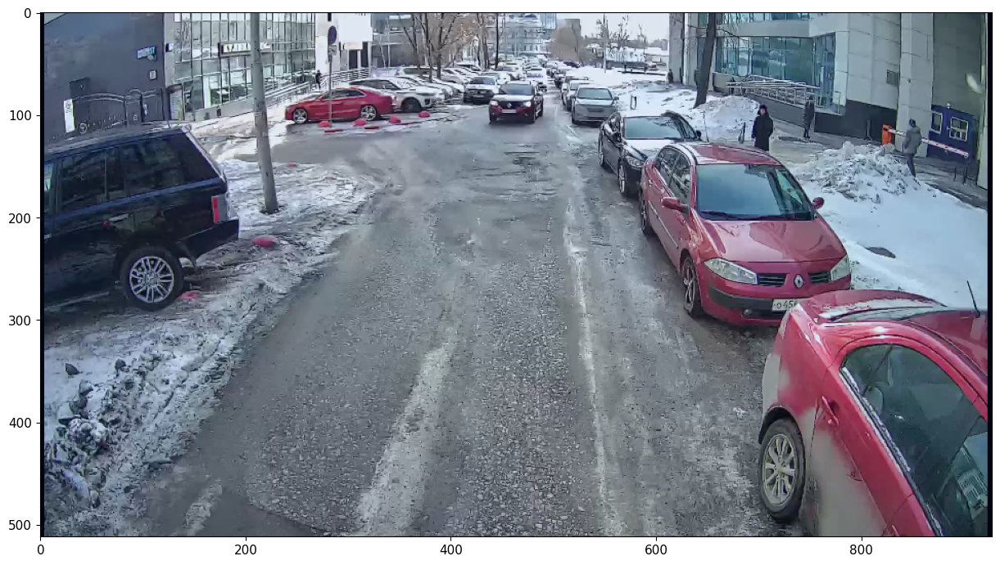

In [ ]:
from pprint import pprint

plt.figure(figsize=(15, 15))
plt.imshow((img.permute(1, 2, 0) - img.min()) / (img.max() - img.min()))

Let's look at car presence map from the neural network perspective. Light areas are related to the place where cars are located. If the areas are coinside with the car's real positions it means that the neural network can detect the cars.

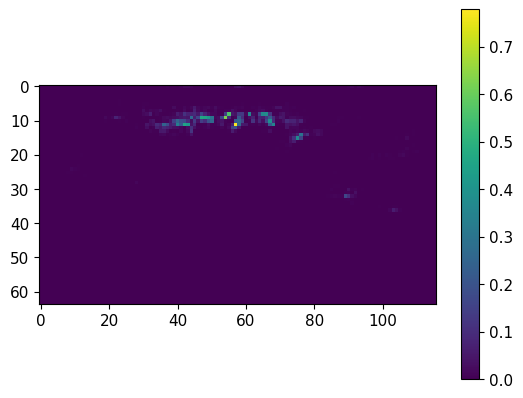

In [ ]:
plt.imshow(((res[0, 0, :, :].detach().cpu())).float())

plt.colorbar()

The real positions of the cars:

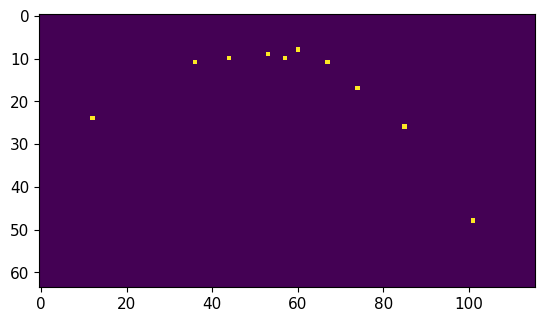

In [ ]:
plt.imshow(datum['targ'][0, :, :])